# Self-Driving Car Engineer Nanodegree


## Project 2: **Advanced Lane Lines** 
***
The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Import Packages

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

## Camera Calibration
---

#### Find Corners
Use the set of images located in the 'camera_cal\' folder of the project to determine corner locations for camera calibrations

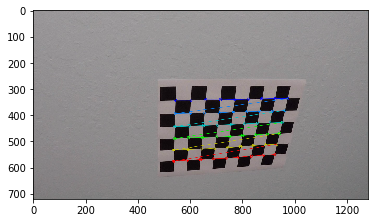

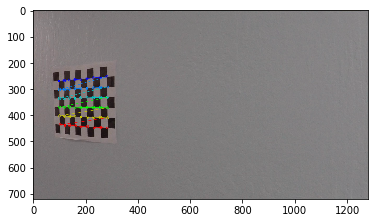

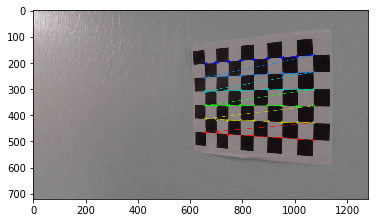

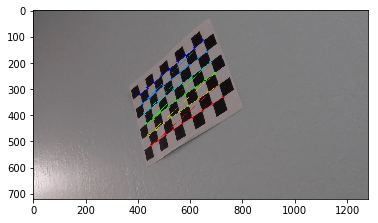

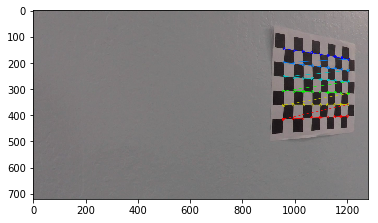

...

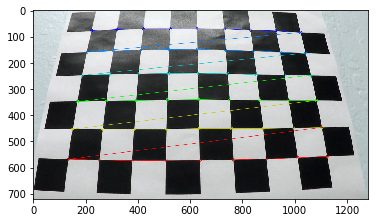

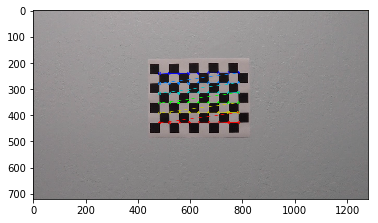

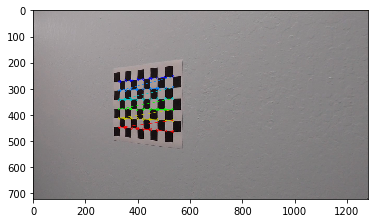

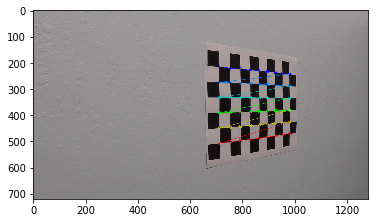

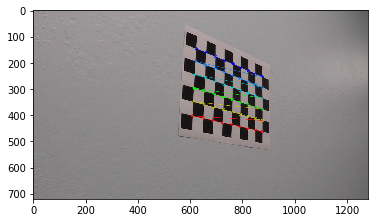

In [2]:
#list of images in camera_cal folder
images = glob.glob('./camera_cal/*.jpg')

#3-d coordinate reference space to use for object points of the corners found
objp = np.mgrid[0:9,0:6,0:1].T.reshape(-1,3).astype(np.float32)

#Arrays to store object points and source points
objpoints = []
imgpoints = []

#list used to keep track of images with found corners
corner_images = []

for fname in images:
    img = cv2.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None) #use 9x6 grid for images

    # If found, draw corners
    if ret == True:
        #append points to lists
        objpoints.append(objp)
        imgpoints.append(corners)
        
        #keep list of images found with valid corners for reference
        corner_images.append(fname)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.figure()
        plt.imshow(img)

#### Calculate calibration matrix and distortion coefficients

Use OpenCV functions cv2.calibrateCamera to calculate matrix and distortion coefficient data to undistort images taken by the camera. (Example of distortion corrected calibration image provided).

undistort test for calibration1.jpg


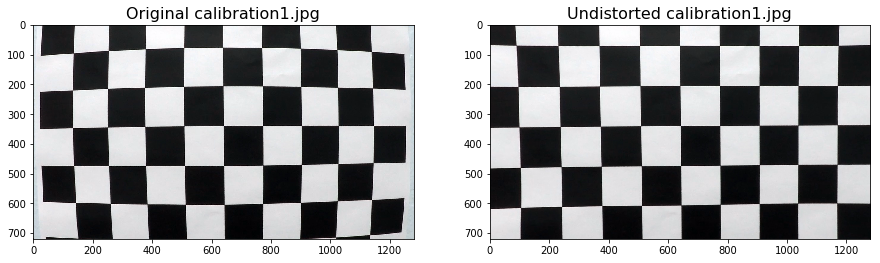

In [3]:
#test image undistort with calibration1.jpg
img = cv2.imread("./camera_cal/calibration1.jpg")

ret, mtx, dist, rvec, tvec = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,9))
ax1.imshow(img)
ax1.set_title('Original calibration1.jpg', fontsize=16)
ax2.imshow(undist)
ax2.set_title('Undistorted calibration1.jpg', fontsize=16)

cv2.imwrite("./output_images/undistorted_calibration_1.jpg", undist)

print("undistort test for calibration1.jpg")

#### Example Distortion Corrected Images

Images taken from 'test_images/' to show example of the undistort effect of the previously calculated calibration data.

test images undistorted


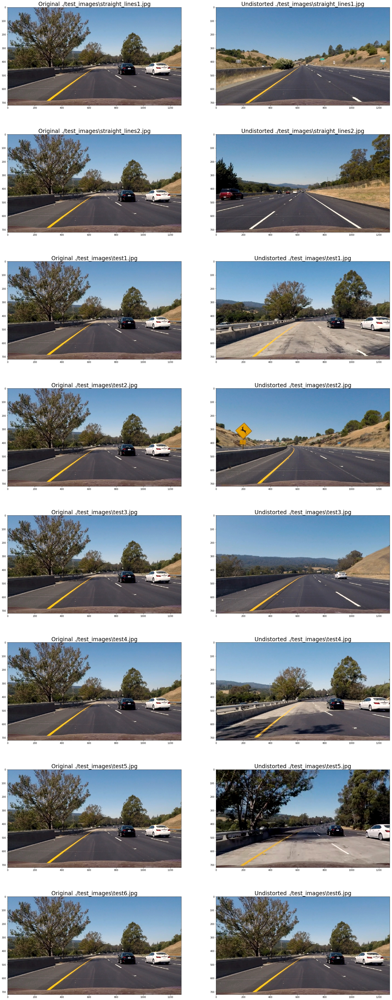

In [13]:
#test image undistort with files from test_image folder
test_images = glob.glob('./test_images/*.jpg')
num = len(test_images)
fig, axes = plt.subplots(num, 2, figsize=(30,10*num))

for i, fname in enumerate(test_images):
    img = mpimg.imread(fname)

    ret, mtx, dist, rvec, tvec = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    axes[i][0].imshow(rgb_img)
    axes[i][0].set_title('Original ' + fname, fontsize=24)
    axes[i][1].imshow(undist)
    axes[i][1].set_title('Undistorted ' + fname, fontsize=24)
    
    mpimg.imsave("./output_images/undistorted_" + fname.split('/')[1].split('\\')[1], undist)

print("test images undistorted")

## Sobel Threshold
---
Use various methods to detect lines

In [14]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient='x', thresh_min=5, thresh_max=100):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = None
    if(orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    return sxbinary

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(abs_sobel)/255 
    abs_sobel = (abs_sobel/scale_factor).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(abs_sobel)
    binary_output[(abs_sobel >= mag_thresh[0]) & (abs_sobel <= mag_thresh[1])] = 1
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.sqrt(np.square(sobelx))
    abs_sobely = np.sqrt(np.square(sobely))
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are metbinary_output =  np.zeros_like(absgraddir)
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

sobel tests


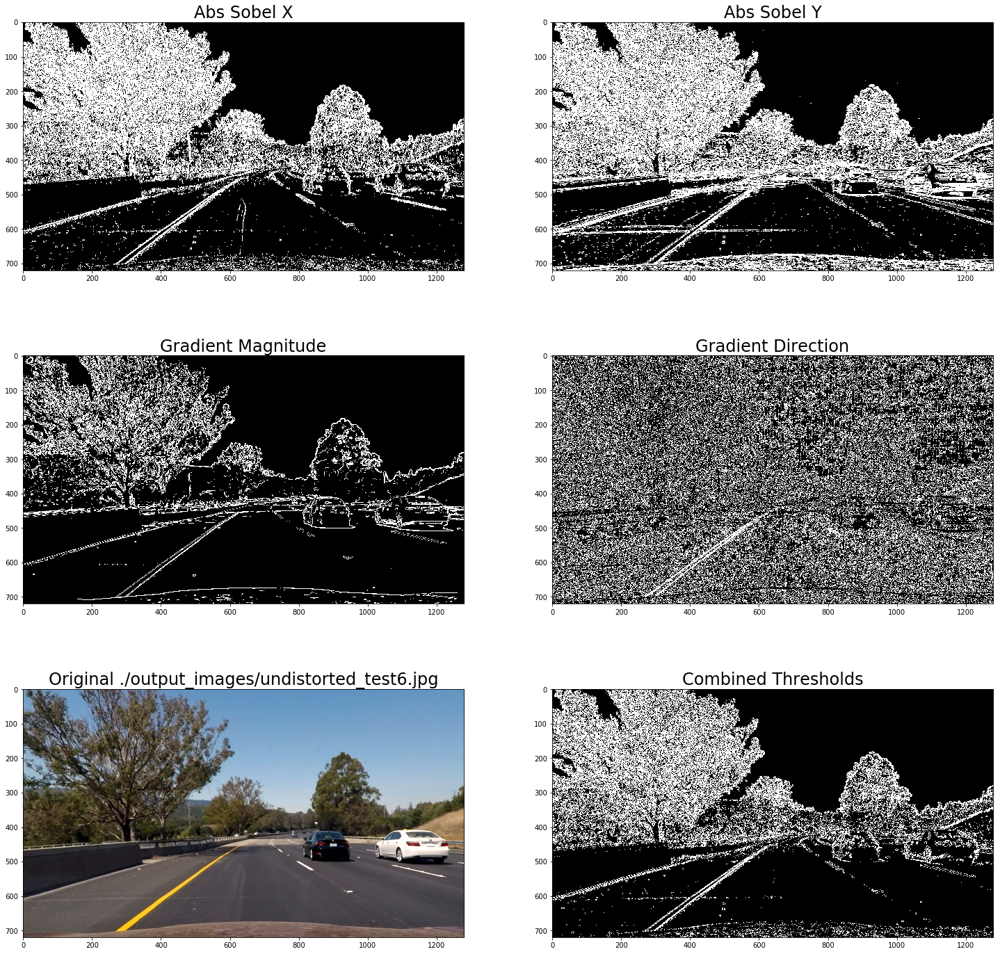

In [15]:
#read test image (choosing one with lots of other objects)
fname = './output_images/undistorted_test6.jpg'
image = mpimg.imread(fname)

ksize = 3
min_thresh = 5
max_thresh = 100

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', thresh_min=min_thresh, thresh_max=max_thresh)
grady = abs_sobel_thresh(image, orient='y', thresh_min=min_thresh, thresh_max=max_thresh)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

fig, axes = plt.subplots(3, 2, figsize=(25,25))

axes[0][0].imshow(gradx, cmap='gray')
axes[0][0].set_title('Abs Sobel X', fontsize=24)

axes[0][1].imshow(grady, cmap='gray')
axes[0][1].set_title('Abs Sobel Y', fontsize=24)

axes[1][0].imshow(mag_binary, cmap='gray')
axes[1][0].set_title('Gradient Magnitude', fontsize=24)

axes[1][1].imshow(dir_binary, cmap='gray')
axes[1][1].set_title('Gradient Direction', fontsize=24)

axes[2][0].imshow(image)
axes[2][0].set_title('Original ' + fname, fontsize=24)

axes[2][1].imshow(combined, cmap='gray')
axes[2][1].set_title('Combined Thresholds', fontsize=24)

print('sobel tests')

### Color Thresholds

channel thresholds


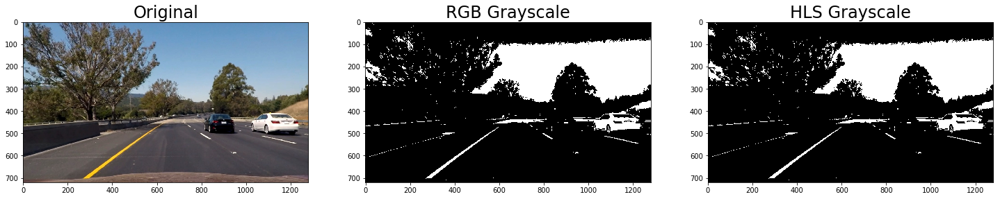

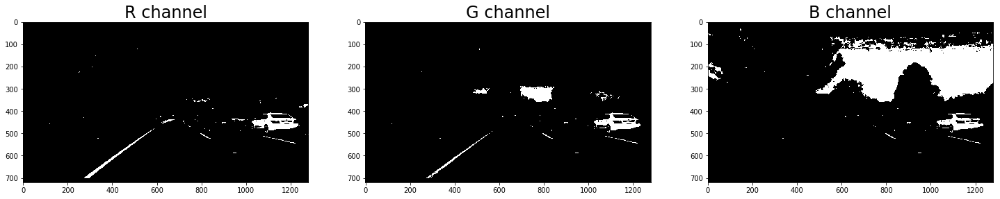

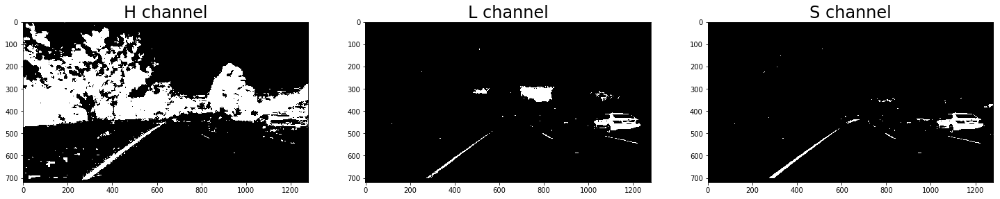

In [27]:
fname = './output_images/undistorted_test6.jpg'
image = mpimg.imread(fname)

def binaryMask(img, thresh):
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary

thresh = (150, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
gray_binary = binaryMask(gray, thresh)

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
hls_binary = binaryMask(gray, thresh)

fig1, axes1 = plt.subplots(1, 3, figsize=(25,8))

axes1[0].imshow(image)
axes1[0].set_title('Original', fontsize=24)

axes1[1].imshow(gray_binary, cmap='gray')
axes1[1].set_title('RGB Grayscale', fontsize=24)

axes1[2].imshow(hls_binary, cmap='gray')
axes1[2].set_title('HLS Grayscale', fontsize=24)

R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

thresh = (200, 255)
R_binary = binaryMask(R, thresh)
G_binary = binaryMask(G, thresh)
B_binary = binaryMask(B, thresh)

fig1, axes1 = plt.subplots(1, 3, figsize=(25,8))

axes1[0].imshow(R_binary, cmap='gray')
axes1[0].set_title('R channel', fontsize=24)

axes1[1].imshow(G_binary, cmap='gray')
axes1[1].set_title('G channel', fontsize=24)

axes1[2].imshow(B_binary, cmap='gray')
axes1[2].set_title('B channel', fontsize=24)

H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

H_binary = binaryMask(H, (15, 100))
L_binary = binaryMask(L, (80, 255))
S_binary = binaryMask(S, (90, 255))

fig1, axes1 = plt.subplots(1, 3, figsize=(25,8))

axes1[0].imshow(H_binary, cmap='gray')
axes1[0].set_title('H channel', fontsize=24)

axes1[1].imshow(G_binary, cmap='gray')
axes1[1].set_title('L channel', fontsize=24)

axes1[2].imshow(R_binary, cmap='gray')
axes1[2].set_title('S channel', fontsize=24)

print('channel thresholds')